# Imports and load data 

In [125]:
import holidays

from collections import defaultdict

import pandas as pd
import matplotlib.pyplot as plt

from collections import Counter

In [77]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 150 # 200 e.g. is really fine, but slower

In [1]:
av = context.catalog.load('int_parts_alphavantage_etf_historic_cleansed')
ip = context.catalog.load('raw_parts_investpy_etf_historic')

2021-06-27 15:54:55,421 - kedro.io.data_catalog - INFO - Loading data from `int_parts_alphavantage_etf_historic_cleansed` (PartitionedDataSet)...
2021-06-27 15:54:55,778 - kedro.io.data_catalog - INFO - Loading data from `raw_parts_investpy_etf_historic` (PartitionedDataSet)...


# Questions
1. Which ETFs are unavailable from Alpha Vantage?
2. Which source contains the most data? (number of rows)
3. Which data source has the largest number of missing values?
4. Do any of the data sources have evidently incorrect data, such as spikes or has not correctly accounted for splits?

## Which ETFs are unavailable from Alpha Vantage?

In [10]:
ip_symbols = {x.split('_')[1] for x in ip.keys()}
av_symbols = {x.split('.')[0] for x in av.keys()}

In [12]:
# ETFs unavailable (when downloaded) from Alpha Vantage
ip_symbols - av_symbols

{'AIAG', 'TRXS', 'VAGP', 'VGER', 'VMOM', 'VUKG', 'VVAL', 'WMVG'}

Verifying these against data from TradingView, these are young stocks (1 to 4 years), with insufficient data for further analysis. We can conclude that missing out on these would be insignificant.

## Which source contains the most data?

In [17]:
ip_norm = {k.split('_')[1]: v for k,v in ip.items()}
av_norm = {k.split('.')[0]: v for k,v in av.items()}

In [27]:
# counting the number of rows in common symbols
# to ascertain which source provides the most data
# and by how many rows

lst = []

for symbol in av_symbols:
    
    ln1 = len(ip_norm[symbol]())
    
    ln2 = len(av_norm[symbol]())
        
    lst.append(ln1 > ln2)
    
    print(f"{symbol}: {ln1} (investpy) \t {ln2} (alpha vantage) \t difference = {ln1 - ln2}")

IESG: 1169 (investpy) 	 1242 (alpha vantage) 	 difference = -73
IHHG: 663 (investpy) 	 823 (alpha vantage) 	 difference = -160
CS51: 1652 (investpy) 	 1984 (alpha vantage) 	 difference = -332
EUXS: 1574 (investpy) 	 1556 (alpha vantage) 	 difference = 18
IWFQ: 1385 (investpy) 	 1392 (alpha vantage) 	 difference = -7
RBTX: 1204 (investpy) 	 1198 (alpha vantage) 	 difference = 6
UKDV: 2354 (investpy) 	 2345 (alpha vantage) 	 difference = 9
IWFV: 1575 (investpy) 	 1600 (alpha vantage) 	 difference = -25
VHYL: 2047 (investpy) 	 2025 (alpha vantage) 	 difference = 22
VGOV: 2298 (investpy) 	 2208 (alpha vantage) 	 difference = 90
IWFM: 1525 (investpy) 	 1545 (alpha vantage) 	 difference = -20
IBTM: 3655 (investpy) 	 3425 (alpha vantage) 	 difference = 230
ISPY: 1452 (investpy) 	 1448 (alpha vantage) 	 difference = 4
IGLS: 3079 (investpy) 	 3078 (alpha vantage) 	 difference = 1
ISUS: 3223 (investpy) 	 2386 (alpha vantage) 	 difference = 837
SGIL: 1647 (investpy) 	 3239 (alpha vantage) 	 diffe

SWDA: 1645 (investpy) 	 2687 (alpha vantage) 	 difference = -1042
VETY: 1027 (investpy) 	 1346 (alpha vantage) 	 difference = -319
IUSF: 769 (investpy) 	 777 (alpha vantage) 	 difference = -8
DRDR: 1174 (investpy) 	 1136 (alpha vantage) 	 difference = 38
HMCH: 2629 (investpy) 	 2592 (alpha vantage) 	 difference = 37
TIPH: 1087 (investpy) 	 1087 (alpha vantage) 	 difference = 0
TP05: 1056 (investpy) 	 1033 (alpha vantage) 	 difference = 23
IMSU: 964 (investpy) 	 494 (alpha vantage) 	 difference = 470
PHSP: 1382 (investpy) 	 3275 (alpha vantage) 	 difference = -1893
SHYU: 1642 (investpy) 	 2465 (alpha vantage) 	 difference = -823
XRSG: 1574 (investpy) 	 1491 (alpha vantage) 	 difference = 83
SPLT: 1014 (investpy) 	 1963 (alpha vantage) 	 difference = -949
ITKY: 3693 (investpy) 	 3633 (alpha vantage) 	 difference = 60
HMEF: 2477 (investpy) 	 2476 (alpha vantage) 	 difference = 1
XSPS: 3375 (investpy) 	 3283 (alpha vantage) 	 difference = 92
GLTS: 2300 (investpy) 	 2169 (alpha vantage) 	 d

In [28]:
# investpy (True) provides more data for more symbols.
Counter(lst)

Counter({False: 71, True: 100})

## Which data source has the largest number of missing values?

In [33]:
today = pd.to_datetime('today')

eng_hols = holidays.England(years=range(1990, today.year)).keys()
weekdays = set(pd.bdate_range(start='1990-01-01', end=today).date)
business_dates = pd.DataFrame(index = weekdays - eng_hols).sort_index()

In [142]:
# Check both sources for missing dates, based on comparing against known business dates

missing = []

for symbol in av_symbols:
        
    data1 = ip_norm[symbol]()
    data1.index = pd.to_datetime(data1.Date)
    df1 = business_dates.copy()[min(data1.index):max(data1.index)]
    df1['close'] = data1['Close']
    ln1 = len(df1[df1.close.isna()])
    
    data2 = av_norm[symbol]()
    data2.index = pd.to_datetime(data2.date)
    df2 = business_dates.copy()[min(data2.index):max(data2.index)]
    df2['close'] = data2['adjusted_close']
    ln2 = len(df2[df2.close.isna()])
    
    missing.append(ln1 > ln2)
    
    print(f"{symbol} \t investpy: {ln1} \t alpha: {ln2}")
        

IESG 	 investpy: 507 	 alpha: 1325
IHHG 	 investpy: 160 	 alpha: 5
CS51 	 investpy: 13 	 alpha: 745
EUXS 	 investpy: 5 	 alpha: 24
IWFQ 	 investpy: 276 	 alpha: 311
RBTX 	 investpy: 9 	 alpha: 18
UKDV 	 investpy: 5 	 alpha: 13
IWFV 	 investpy: 85 	 alpha: 98
VHYL 	 investpy: 5 	 alpha: 6
VGOV 	 investpy: 5 	 alpha: 96
IWFM 	 investpy: 131 	 alpha: 159
IBTM 	 investpy: 23 	 alpha: 241
ISPY 	 investpy: 5 	 alpha: 10
IGLS 	 investpy: 5 	 alpha: 6
ISUS 	 investpy: 228 	 alpha: 1013
SGIL 	 investpy: 5 	 alpha: 25
SHYG 	 investpy: 37 	 alpha: 26
SLXX 	 investpy: 90 	 alpha: 5
SSLN 	 investpy: 39 	 alpha: 57
ROBG 	 investpy: 5 	 alpha: 161
VUSA 	 investpy: 5 	 alpha: 13
SJPA 	 investpy: 6 	 alpha: 341
AGBP 	 investpy: 44 	 alpha: 5
CNX1 	 investpy: 7 	 alpha: 163
VMID 	 investpy: 5 	 alpha: 5
IS15 	 investpy: 6 	 alpha: 6
HDLG 	 investpy: 173 	 alpha: 392
UKCO 	 investpy: 6 	 alpha: 34
CSUK 	 investpy: 26 	 alpha: 497
XUFB 	 investpy: 153 	 alpha: 155
ISWD 	 investpy: 80 	 alpha: 1028
IJPN 	 

In [143]:
# investpy has much fewer symbols with missing data
Counter(missing)

Counter({False: 141, True: 30})

## Do any of the data sources have evidently incorrect data, such as spikes or has not correctly accounted for splits?

In [146]:
# loop through each ETF, plot graph
# record noticable inaccuracies in the data (spikes, sig missing periods, anaccounted splits etc) 
# compare against recorded missing

In [142]:
# Check both sources for missing dates, based on comparing against known business dates

missing = []

for symbol in av_symbols:
        
    data1 = ip_norm[symbol]()
    data1.index = pd.to_datetime(data1.Date)
    df1 = business_dates.copy()[min(data1.index):max(data1.index)]
    df1['close'] = data1['Close']
    ln1 = len(df1[df1.close.isna()])
    
    data2 = av_norm[symbol]()
    data2.index = pd.to_datetime(data2.date)
    df2 = business_dates.copy()[min(data2.index):max(data2.index)]
    df2['close'] = data2['adjusted_close']
    ln2 = len(df2[df2.close.isna()])
    
    missing.append(ln1 > ln2)
    
    print(f"{symbol} \t investpy: {ln1} \t alpha: {ln2}")
        

IESG 	 investpy: 507 	 alpha: 1325
IHHG 	 investpy: 160 	 alpha: 5
CS51 	 investpy: 13 	 alpha: 745
EUXS 	 investpy: 5 	 alpha: 24
IWFQ 	 investpy: 276 	 alpha: 311
RBTX 	 investpy: 9 	 alpha: 18
UKDV 	 investpy: 5 	 alpha: 13
IWFV 	 investpy: 85 	 alpha: 98
VHYL 	 investpy: 5 	 alpha: 6
VGOV 	 investpy: 5 	 alpha: 96
IWFM 	 investpy: 131 	 alpha: 159
IBTM 	 investpy: 23 	 alpha: 241
ISPY 	 investpy: 5 	 alpha: 10
IGLS 	 investpy: 5 	 alpha: 6
ISUS 	 investpy: 228 	 alpha: 1013
SGIL 	 investpy: 5 	 alpha: 25
SHYG 	 investpy: 37 	 alpha: 26
SLXX 	 investpy: 90 	 alpha: 5
SSLN 	 investpy: 39 	 alpha: 57
ROBG 	 investpy: 5 	 alpha: 161
VUSA 	 investpy: 5 	 alpha: 13
SJPA 	 investpy: 6 	 alpha: 341
AGBP 	 investpy: 44 	 alpha: 5
CNX1 	 investpy: 7 	 alpha: 163
VMID 	 investpy: 5 	 alpha: 5
IS15 	 investpy: 6 	 alpha: 6
HDLG 	 investpy: 173 	 alpha: 392
UKCO 	 investpy: 6 	 alpha: 34
CSUK 	 investpy: 26 	 alpha: 497
XUFB 	 investpy: 153 	 alpha: 155
ISWD 	 investpy: 80 	 alpha: 1028
IJPN 	 

<AxesSubplot:>

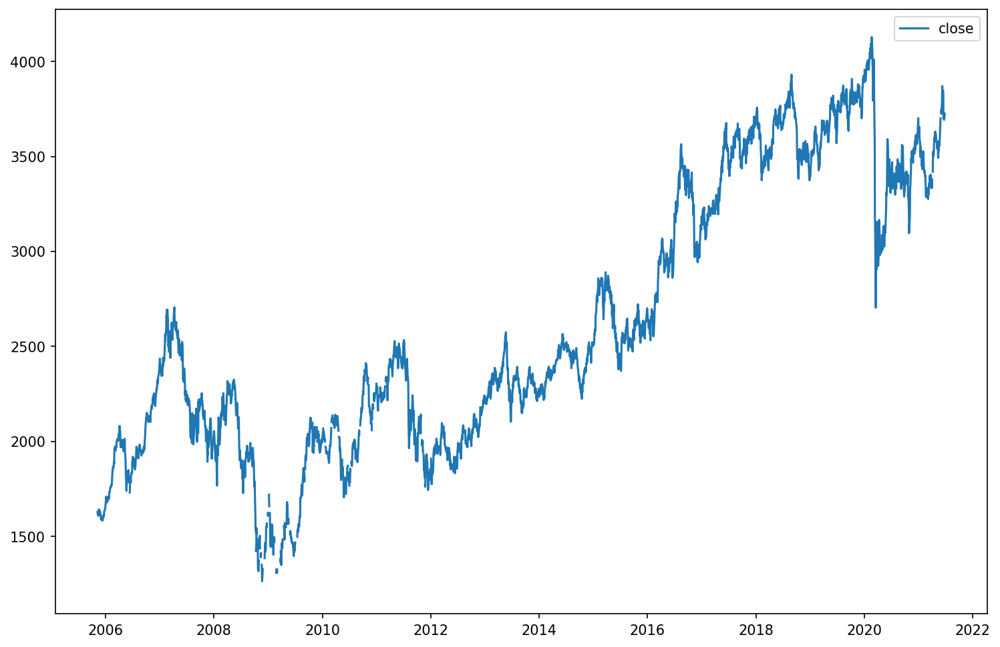

In [145]:
df2.plot()

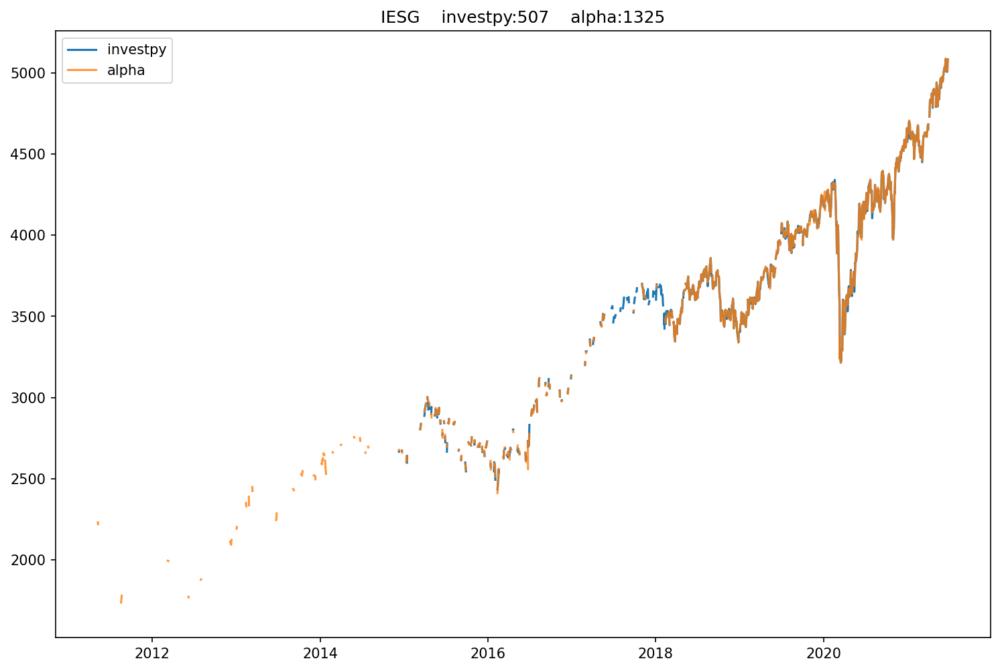

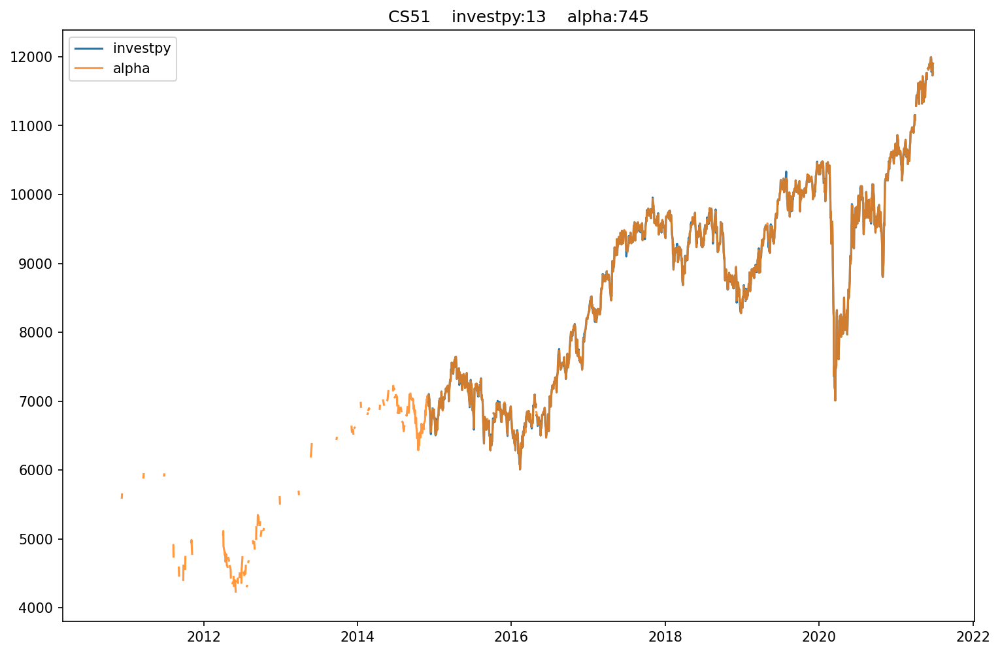

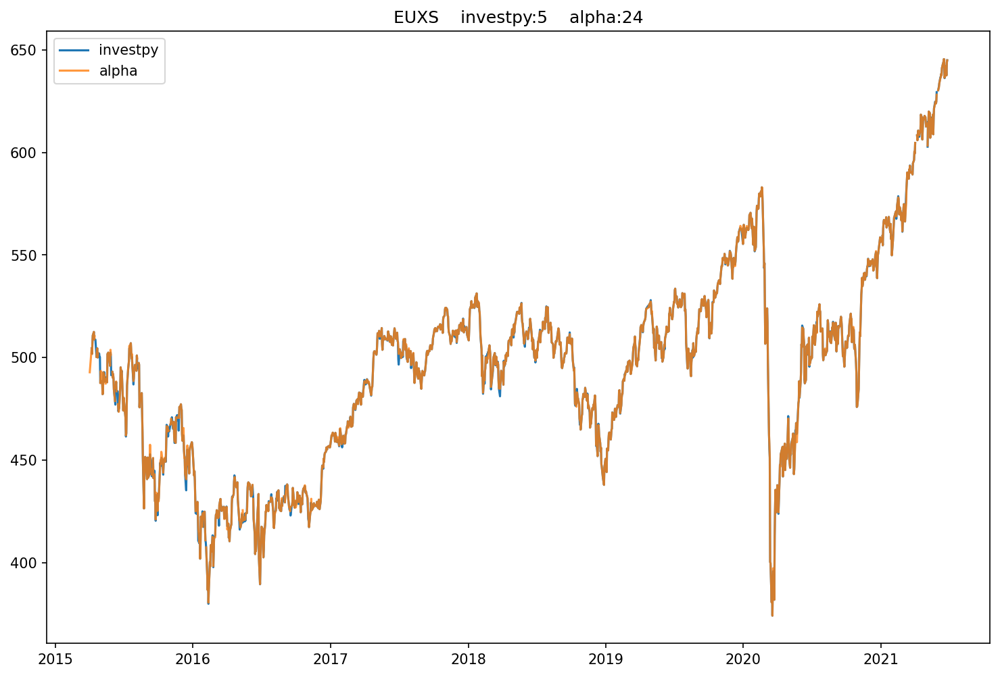

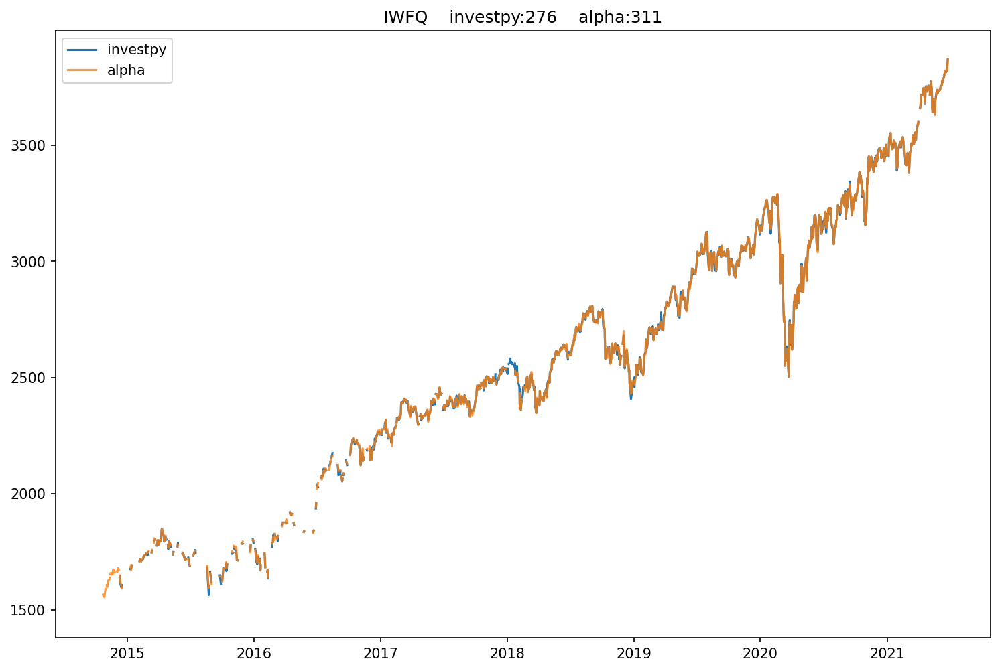

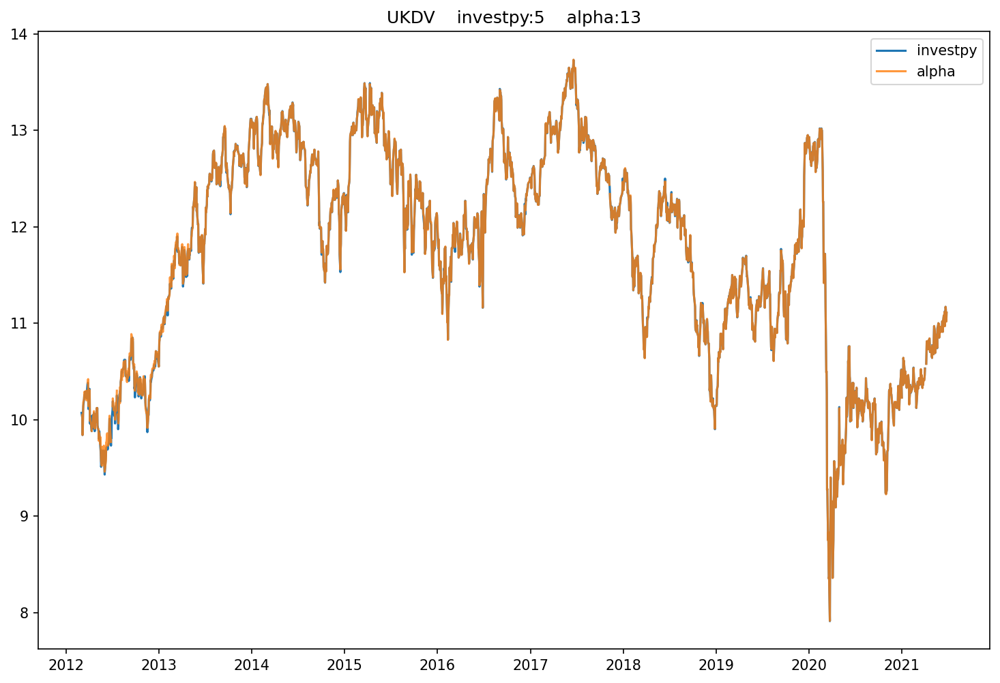

...

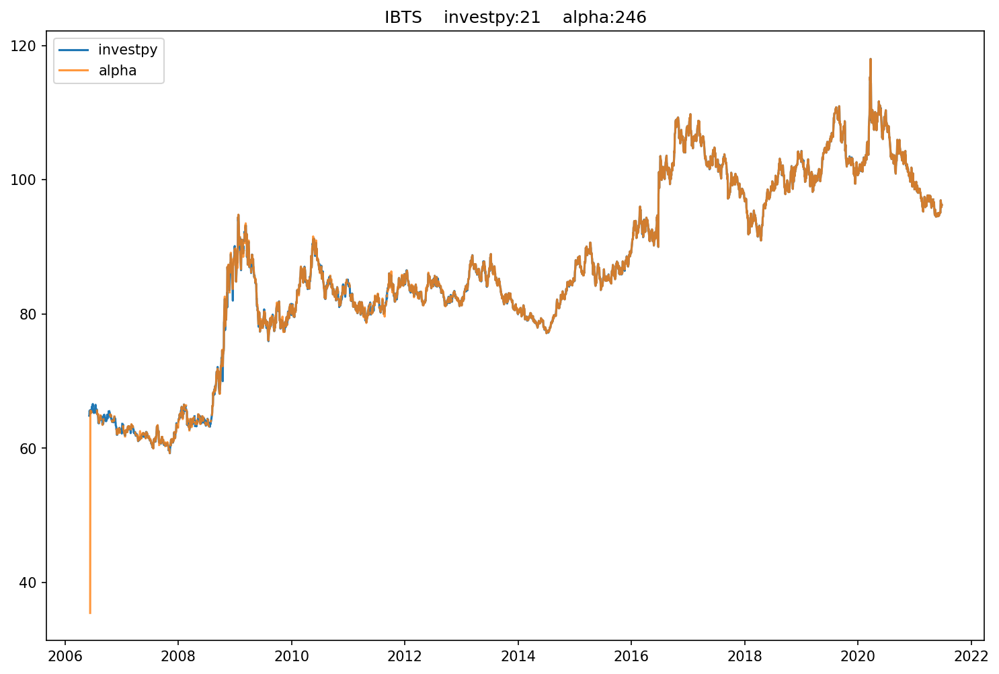

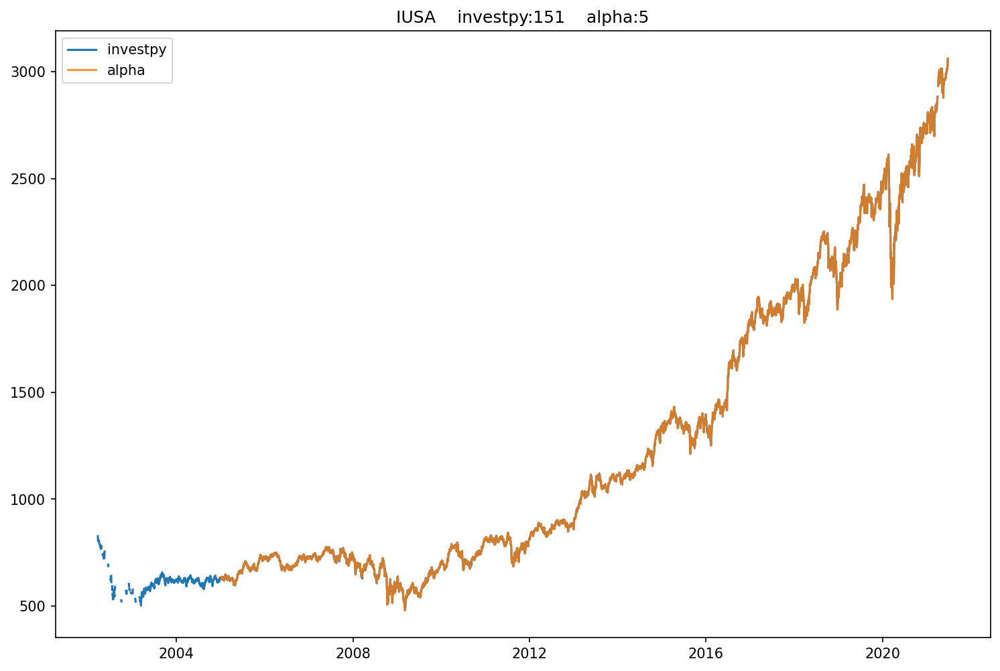

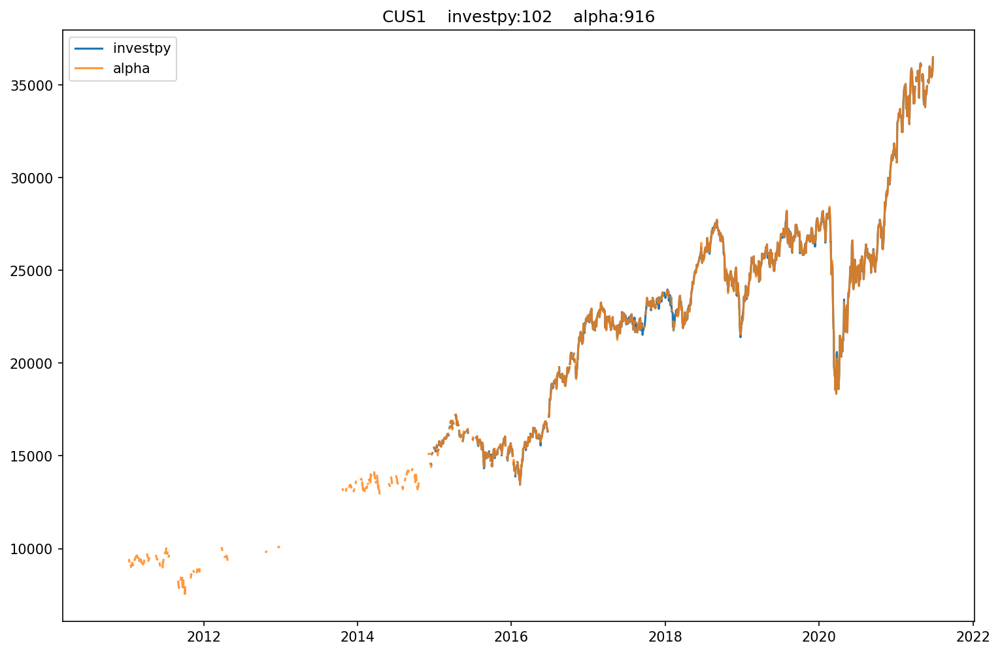

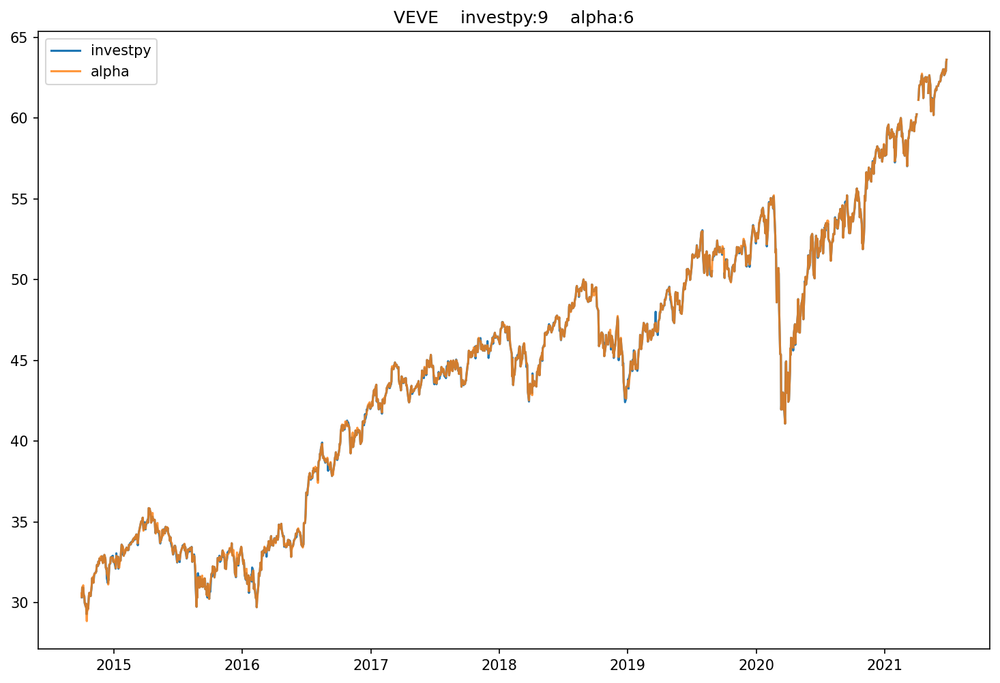

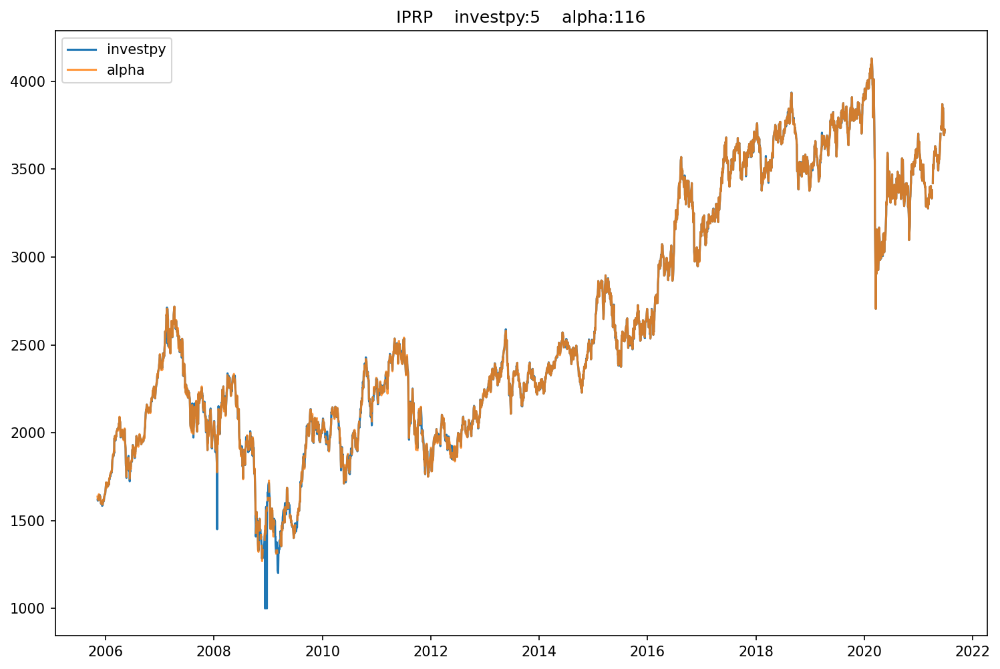

In [169]:
# Check both sources for missing dates, based on comparing against known business dates

missing = []

for symbol in av_symbols:
        
    data1 = ip_norm[symbol]()
    data1.index = pd.to_datetime(data1.Date)
    df1 = business_dates.copy()[min(data1.index):max(data1.index)]
    df1['close'] = data1['Close']
    
    ln1 = len(df1[df1.close.isna()])
    
    data2 = av_norm[symbol]()
    data2.index = pd.to_datetime(data2.date)
    df2 = business_dates.copy()[min(data2.index):max(data2.index)]
    df2['close'] = data2['close']
    ln2 = len(df2[df2.close.isna()])
    
    if (len(df2) < 1250) and (len(df1) < 1250):
        continue
    
    plt.plot(df1.close, label="investpy", alpha=1)
    plt.legend()
    plt.plot(df2.close, label="alpha", alpha=0.8)
    plt.legend()
    plt.title(f"{symbol}    investpy:{ln1}    alpha:{ln2}")
    
    plt.pause(1)
    plt.show()
    
    input()
    
        

# Conclusion

Having reviewed price data from both investpy and Alpha Vantage, the differences are not actually that prominent.There are differences in time periods covered, and these can vary between the data sources.

The three main observations to address are:
1. Missing data
2. Blips in data
3. Incorrect GBX/GBP conversion

Missing data can be addressed by overlaying both data sources and filling in the missing with the other. Would need to think about which data source to start with. Basic interpolation could be used to fill the missing dates, however this would not work well with large periods of missing data, appearing as a straight line and having no volatility. Alternatively, there may be a solution using the distribution and randomly applying the distribution centering around a suitable moving average or alternative trend line.

Blips in data is a little trickier to deal with, as this requires identifying these as outliers without capturing the true price data. Price data naturally has fat tails, so may have large price fluctuations which look like outliers. One way to address this is to verify against other data, checking for a unexpected difference between price sources.

Incorrect GBX/GBP conversion can be addressed by downloading additional data from Alpha Vantage which specifies the currency (GBX or GBP). This could also be ignored, but might then be incompatible when comparing against current portfolio.


As a temporary solution, I will use Alpha Vantage only, extracting the distribution only from valid consecutive price data, and using simple interpolation to address missing points (for calculating MA). This has the advantage of being much quicker to implement. A minimum amount of data will be required to form the distribution.